In [187]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from sklearn.preprocessing import StandardScaler, PowerTransformer, MinMaxScaler, OneHotEncoder
from sklearn.base import TransformerMixin, BaseEstimator, clone
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score, make_scorer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from IPython.display import display, HTML
#from skopt import BayesSearchCV
#from skopt.space import Real, Categorical, Integer
import pickle
from scipy.stats import uniform

import seaborn as sns

In [153]:
df = pd.read_csv(r"C:\Users\swath\Downloads\Training Data_2021.csv", na_values=["missing"])

C:\Users\swath\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3441: DtypeWarning: Columns (19) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [154]:
df

,application_key,mvar1,mvar2,mvar3,mvar4,mvar5,mvar6,mvar7,mvar8,mvar9,...,mvar39,mvar40,mvar41,mvar42,mvar43,mvar44,mvar45,mvar46,mvar47,default_ind
0,230032,1696,1.6541,0.000,0.0,0.0,0.0,6015.0,322.0,40369.0,...,1,73.780,82.547,0.08696,10,0.63899,na,0,C,0
1,230033,1846,0.8095,0.000,0.0,0.0,102.0,7532.0,3171.0,18234.0,...,0,99.129,NaN,0.00000,13,0.63836,na,na,L,1
2,230034,1745,0.4001,0.000,0.0,0.0,NaN,2536.0,NaN,NaN,...,0,NaN,29.290,0.00000,1,1.00000,na,0,C,1
3,230035,1739,0.2193,0.000,0.0,0.0,1982.0,26440.0,4955.0,20316.0,...,0,96.272,NaN,0.15385,3,0.53241,0,0,L,0
4,230036,1787,0.0118,0.225,0.0,0.0,5451.0,5494.0,5494.0,7987.0,...,0,115.019,NaN,0.00000,1,0.92665,na,na,L,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82995,578064,1748,0.3044,0.000,0.0,0.0,0.0,20114.0,5574.0,77386.0,...,0,NaN,8.445,0.04348,13,0.48002,0,0,L,0
82996,578065,1846,NaN,0.000,0.0,0.0,793.0,18608.0,18608.0,63820.0,...,0,NaN,NaN,0.00000,5,0.46925,na,0,L,0
82997,578066,1907,0.0381,0.000,0.0,0.0,2478.0,24775.0,24775.0,100294.0,...,0,137.164,42.857,0.00000,19,0.67960,na,0,L,0
82998,578067,1744,1.8301,0.000,0.0,0.0,496.0,917.0,496.0,116164.0,...,0,NaN,NaN,0.09375,3,0.45317,na,0,L,0


In [155]:
df["default_ind"].value_counts()
#imbalance

0    59145
1    23855
Name: default_ind, dtype: int64

In [156]:
df.shape

(83000, 49)

In [157]:
df["mvar16"] = df["mvar16"].replace("na", np.NaN)
df["mvar17"] = df["mvar17"].replace("na", np.NaN)
df["mvar18"] = df["mvar18"].replace("na", np.NaN)
df["mvar19"] = df["mvar19"].replace("na", np.NaN)
df["mvar20"] = df["mvar20"].replace("na", np.NaN)
df["mvar34"] = df["mvar34"].replace("na", np.NaN)
df["mvar35"] = df["mvar35"].replace("na", np.NaN)
df["mvar36"] = df["mvar36"].replace("na", np.NaN)
df["mvar37"] = df["mvar37"].replace("na", np.NaN)
df["mvar38"] = df["mvar38"].replace("na", np.NaN)
df["mvar39"] = df["mvar39"].replace("na", np.NaN)
df["mvar45"] = df["mvar45"].replace("na", np.NaN)
df["mvar46"] = df["mvar46"].replace("na", np.NaN)
df["mvar43"] = df["mvar43"].replace("na", np.NaN)
df["mvar1"] = df["mvar1"].replace("na", np.NaN)

In [158]:
df

,application_key,mvar1,mvar2,mvar3,mvar4,mvar5,mvar6,mvar7,mvar8,mvar9,...,mvar39,mvar40,mvar41,mvar42,mvar43,mvar44,mvar45,mvar46,mvar47,default_ind
0,230032,1696,1.6541,0.000,0.0,0.0,0.0,6015.0,322.0,40369.0,...,1,73.780,82.547,0.08696,10,0.63899,NaN,0,C,0
1,230033,1846,0.8095,0.000,0.0,0.0,102.0,7532.0,3171.0,18234.0,...,0,99.129,NaN,0.00000,13,0.63836,NaN,NaN,L,1
2,230034,1745,0.4001,0.000,0.0,0.0,NaN,2536.0,NaN,NaN,...,0,NaN,29.290,0.00000,1,1.00000,NaN,0,C,1
3,230035,1739,0.2193,0.000,0.0,0.0,1982.0,26440.0,4955.0,20316.0,...,0,96.272,NaN,0.15385,3,0.53241,0,0,L,0
4,230036,1787,0.0118,0.225,0.0,0.0,5451.0,5494.0,5494.0,7987.0,...,0,115.019,NaN,0.00000,1,0.92665,NaN,NaN,L,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82995,578064,1748,0.3044,0.000,0.0,0.0,0.0,20114.0,5574.0,77386.0,...,0,NaN,8.445,0.04348,13,0.48002,0,0,L,0
82996,578065,1846,NaN,0.000,0.0,0.0,793.0,18608.0,18608.0,63820.0,...,0,NaN,NaN,0.00000,5,0.46925,NaN,0,L,0
82997,578066,1907,0.0381,0.000,0.0,0.0,2478.0,24775.0,24775.0,100294.0,...,0,137.164,42.857,0.00000,19,0.67960,NaN,0,L,0
82998,578067,1744,1.8301,0.000,0.0,0.0,496.0,917.0,496.0,116164.0,...,0,NaN,NaN,0.09375,3,0.45317,NaN,0,L,0


In [159]:
df["mvar47"].value_counts()
df["mvar47"] = df["mvar47"].replace("C", 1)
df["mvar47"] = df["mvar47"].replace("L", 0)
df["mvar47"].value_counts()
df.head()

,application_key,mvar1,mvar2,mvar3,mvar4,mvar5,mvar6,mvar7,mvar8,mvar9,...,mvar39,mvar40,mvar41,mvar42,mvar43,mvar44,mvar45,mvar46,mvar47,default_ind
0,230032,1696,1.6541,0.000,0.0,0.0,0.0,6015.0,322.0,40369.0,...,1,73.780,82.547,0.08696,10,0.63899,NaN,0,1,0
1,230033,1846,0.8095,0.000,0.0,0.0,102.0,7532.0,3171.0,18234.0,...,0,99.129,NaN,0.00000,13,0.63836,NaN,NaN,0,1
2,230034,1745,0.4001,0.000,0.0,0.0,NaN,2536.0,NaN,NaN,...,0,NaN,29.290,0.00000,1,1.00000,NaN,0,1,1
3,230035,1739,0.2193,0.000,0.0,0.0,1982.0,26440.0,4955.0,20316.0,...,0,96.272,NaN,0.15385,3,0.53241,0,0,0,0
4,230036,1787,0.0118,0.225,0.0,0.0,5451.0,5494.0,5494.0,7987.0,...,0,115.019,NaN,0.00000,1,0.92665,NaN,NaN,0,0


In [160]:
df = df.drop(columns = ['application_key'])
df.head()

,mvar1,mvar2,mvar3,mvar4,mvar5,mvar6,mvar7,mvar8,mvar9,mvar10,...,mvar39,mvar40,mvar41,mvar42,mvar43,mvar44,mvar45,mvar46,mvar47,default_ind
0,1696,1.6541,0.000,0.0,0.0,0.0,6015.0,322.0,40369.0,18414.0,...,1,73.780,82.547,0.08696,10,0.63899,NaN,0,1,0
1,1846,0.8095,0.000,0.0,0.0,102.0,7532.0,3171.0,18234.0,13664.0,...,0,99.129,NaN,0.00000,13,0.63836,NaN,NaN,0,1
2,1745,0.4001,0.000,0.0,0.0,NaN,2536.0,NaN,NaN,2536.0,...,0,NaN,29.290,0.00000,1,1.00000,NaN,0,1,1
3,1739,0.2193,0.000,0.0,0.0,1982.0,26440.0,4955.0,20316.0,37013.0,...,0,96.272,NaN,0.15385,3,0.53241,0,0,0,0
4,1787,0.0118,0.225,0.0,0.0,5451.0,5494.0,5494.0,7987.0,4696.0,...,0,115.019,NaN,0.00000,1,0.92665,NaN,NaN,0,0


In [161]:
df.isna()

,mvar1,mvar2,mvar3,mvar4,mvar5,mvar6,mvar7,mvar8,mvar9,mvar10,...,mvar39,mvar40,mvar41,mvar42,mvar43,mvar44,mvar45,mvar46,mvar47,default_ind
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,True,True,False,False
2,False,False,False,False,False,True,False,True,True,False,...,False,True,False,False,False,False,True,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,True,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82995,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
82996,False,True,False,False,False,False,False,False,False,False,...,False,True,True,False,False,False,True,False,False,False
82997,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
82998,False,False,False,False,False,False,False,False,False,False,...,False,True,True,False,False,False,True,False,False,False


In [162]:
df.isna().sum().sort_values(ascending = True)

default_ind        0
mvar47             0
mvar14             0
mvar19             5
mvar5            535
mvar38           535
mvar20           535
mvar10           535
mvar29           535
mvar28           535
mvar3            535
mvar4            535
mvar34           535
mvar43           889
mvar33          1869
mvar42          2023
mvar36          3159
mvar1           3733
mvar2           5886
mvar39          6329
mvar7           7674
mvar25          7862
mvar37          7862
mvar32          7862
mvar44          8149
mvar13          9689
mvar26         10929
mvar9          11682
mvar27         13650
mvar12         14578
mvar18         15359
mvar17         16499
mvar16         19243
mvar24         19530
mvar6          19701
mvar8          19709
mvar21         23462
mvar46         23603
mvar22         30668
mvar15         33519
mvar35         34868
mvar30         37988
mvar23         42311
mvar45         45920
mvar11         46717
mvar41         57264
mvar31         58539
mvar40       

## Loading the new dataset

In [212]:
df_train = pd.read_csv(r"C:\Users\swath\clean.csv", index_col = False)
df_train = df_train.drop(columns = ["Unnamed: 0"])

In [213]:
df_train = df_train.drop(columns = ['mvar21', 'mvar46', 'mvar22', 'mvar15', 'mvar30', 'mvar23', 'mvar45', 'mvar11', 'mvar41', 'mvar31', 'mvar40'])

In [214]:
df_train

,mvar1,mvar2,mvar3,mvar4,mvar5,mvar6,mvar7,mvar8,mvar9,mvar10,...,mvar35,mvar36,mvar37,mvar38,mvar39,mvar42,mvar43,mvar44,mvar47,default_ind
0,1696.0,1.6541,0.000,0.0,0.0,0.0,6015.0,322.0,40369.0,18414.0,...,0.0,8.0,10.0,4.0,1.0,0.08696,10.0,0.63899,1,0
1,1846.0,0.8095,0.000,0.0,0.0,102.0,7532.0,3171.0,18234.0,13664.0,...,0.0,8.0,0.0,2.0,0.0,0.00000,13.0,0.63836,0,1
2,1745.0,0.4001,0.000,0.0,0.0,NaN,2536.0,NaN,NaN,2536.0,...,NaN,1.0,NaN,1.0,0.0,0.00000,1.0,1.00000,1,1
3,1739.0,0.2193,0.000,0.0,0.0,1982.0,26440.0,4955.0,20316.0,37013.0,...,0.0,3.0,3.0,2.0,0.0,0.15385,3.0,0.53241,0,0
4,1787.0,0.0118,0.225,0.0,0.0,5451.0,5494.0,5494.0,7987.0,4696.0,...,0.0,2.0,3.0,2.0,0.0,0.00000,1.0,0.92665,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82995,1748.0,0.3044,0.000,0.0,0.0,0.0,20114.0,5574.0,77386.0,81647.0,...,0.0,11.0,3.0,4.0,0.0,0.04348,13.0,0.48002,0,0
82996,1846.0,NaN,0.000,0.0,0.0,793.0,18608.0,18608.0,63820.0,29187.0,...,NaN,2.0,6.0,1.0,0.0,0.00000,5.0,0.46925,0,0
82997,1907.0,0.0381,0.000,0.0,0.0,2478.0,24775.0,24775.0,100294.0,88249.0,...,NaN,14.0,8.0,0.0,0.0,0.00000,19.0,0.67960,0,0
82998,1744.0,1.8301,0.000,0.0,0.0,496.0,917.0,496.0,116164.0,2218.0,...,NaN,1.0,22.0,4.0,0.0,0.09375,3.0,0.45317,0,0


In [199]:
df_bool = df_train.corr() > 0.8
df_bool.sum()

mvar1          1
mvar2          1
mvar3          1
mvar4          1
mvar5          1
mvar6          1
mvar7          2
mvar8          1
mvar9          1
mvar10         2
mvar12         1
mvar13         1
mvar14         1
mvar16         3
mvar17         3
mvar18         3
mvar19         2
mvar20         2
mvar24         1
mvar25         1
mvar26         2
mvar27         2
mvar28         1
mvar29         1
mvar32         2
mvar33         1
mvar34         1
mvar35         1
mvar36         1
mvar37         2
mvar38         1
mvar39         1
mvar42         1
mvar43         1
mvar44         1
mvar47         1
default_ind    1
dtype: int64

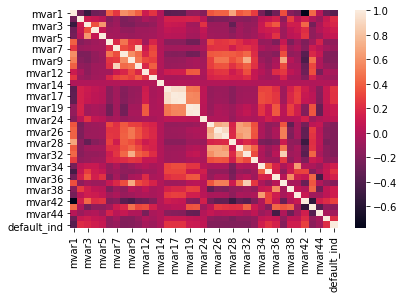

In [192]:
sns.heatmap(df_trial.corr())
plt.show()

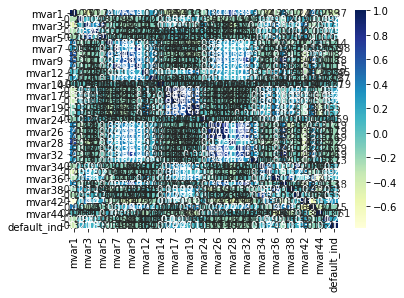

In [193]:
# plotting correlation heatmap
dataplot = sns.heatmap(df_trial.corr(), cmap="YlGnBu", annot=True)
  
# displaying heatmap
plt.show()

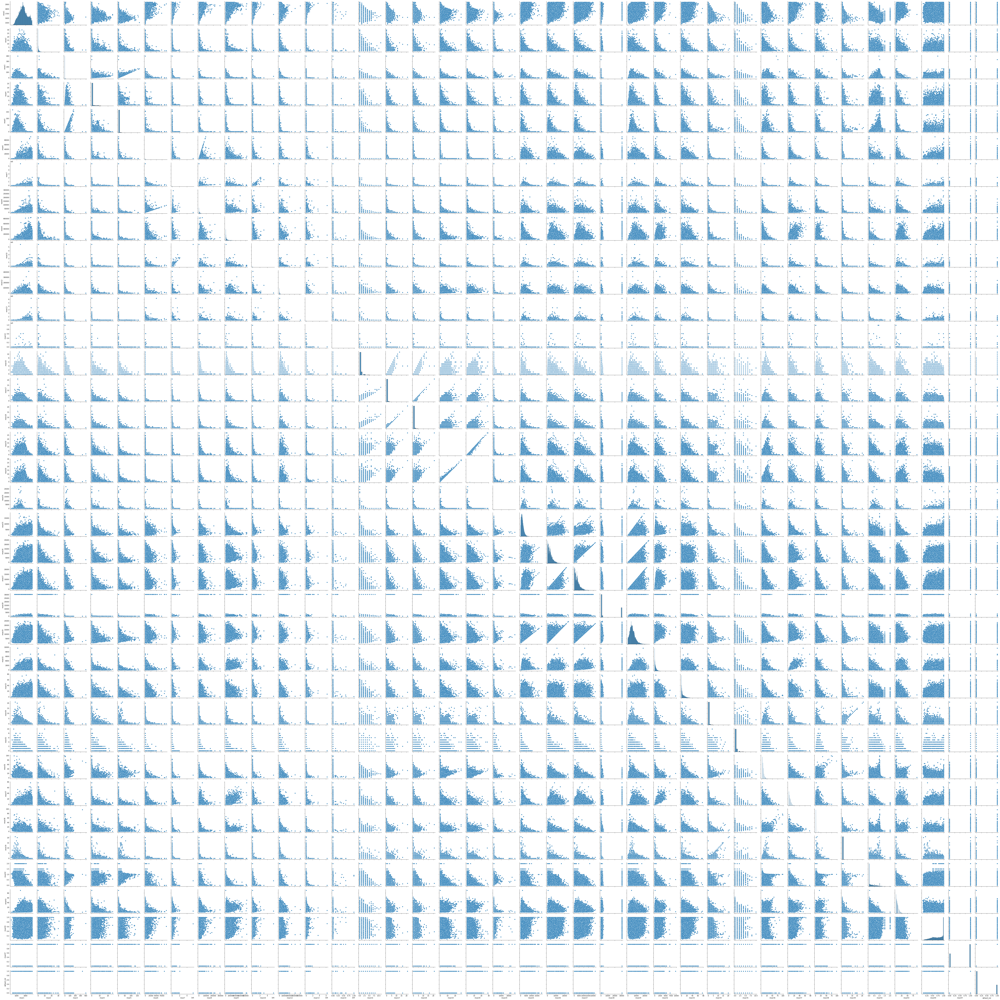

In [194]:
sns.pairplot(df_trial)
plt.show()

In [195]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
import matplotlib.pyplot as plt 
plt.rc("font", size=14)
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import seaborn as sns
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)

In [215]:
df_train = df_train.dropna()

In [216]:
df_train

,mvar1,mvar2,mvar3,mvar4,mvar5,mvar6,mvar7,mvar8,mvar9,mvar10,...,mvar35,mvar36,mvar37,mvar38,mvar39,mvar42,mvar43,mvar44,mvar47,default_ind
0,1696.0,1.6541,0.000,0.000,0.0,0.0,6015.0,322.0,40369.0,18414.0,...,0.0,8.0,10.0,4.0,1.0,0.08696,10.0,0.63899,1,0
1,1846.0,0.8095,0.000,0.000,0.0,102.0,7532.0,3171.0,18234.0,13664.0,...,0.0,8.0,0.0,2.0,0.0,0.00000,13.0,0.63836,0,1
3,1739.0,0.2193,0.000,0.000,0.0,1982.0,26440.0,4955.0,20316.0,37013.0,...,0.0,3.0,3.0,2.0,0.0,0.15385,3.0,0.53241,0,0
4,1787.0,0.0118,0.225,0.000,0.0,5451.0,5494.0,5494.0,7987.0,4696.0,...,0.0,2.0,3.0,2.0,0.0,0.00000,1.0,0.92665,0,0
11,1681.0,1.5888,5.685,3.566,0.0,93.0,3554.0,439.0,2527.0,7086.0,...,0.0,11.0,0.0,5.0,1.0,0.61111,7.0,0.81172,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82990,1795.0,1.5451,0.000,0.000,0.0,30.0,95046.0,16054.0,82871.0,173366.0,...,0.0,8.0,10.0,7.0,0.0,0.12500,10.0,0.62857,0,0
82992,1744.0,1.3696,5.878,0.000,0.0,243.0,3581.0,396.0,16054.0,7589.0,...,0.0,6.0,8.0,4.0,0.0,0.25000,5.0,0.38057,0,0
82994,1722.0,1.3935,0.000,0.000,0.0,19.0,916.0,916.0,3270.0,2883.0,...,0.0,4.0,0.0,6.0,0.0,0.00000,4.0,0.82178,0,0
82995,1748.0,0.3044,0.000,0.000,0.0,0.0,20114.0,5574.0,77386.0,81647.0,...,0.0,11.0,3.0,4.0,0.0,0.04348,13.0,0.48002,0,0


In [217]:
X_train = df_train.loc[:, df_train.columns != 'default_ind']
y_train = df_train.loc[:, df_train.columns == 'default_ind']
X_train.shape
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

(40271, 36)

In [243]:
df_test = pd.read_csv(r"C:\Users\swath\clean_test.csv", index_col = False)
df_test

,application_key,mvar1,mvar2,mvar3,mvar4,mvar5,mvar6,mvar7,mvar8,mvar9,...,mvar38,mvar39,mvar40,mvar41,mvar42,mvar43,mvar44,mvar45,mvar46,mvar47
0,578069,1719.0,0.6174,8.623,0.000,0.000,258.0,258.0,258.0,10729.0,...,2.0,0.0,NaN,NaN,0.54545,2.0,0.91837,0.0,0.0,1
1,578070,1795.0,0.2051,0.000,0.000,0.000,1685.0,12711.0,8913.0,80519.0,...,4.0,0.0,NaN,NaN,0.17241,4.0,0.94563,0.0,0.0,1
2,578071,1742.0,0.5082,0.000,0.000,0.000,1185.0,8954.0,8954.0,1189.0,...,1.0,0.0,NaN,NaN,0.64706,1.0,0.97054,0.0,0.0,1
3,578072,1685.0,0.2595,25.409,0.000,0.000,NaN,3354.0,NaN,NaN,...,2.0,0.0,NaN,NaN,0.85714,1.0,1.00000,NaN,0.0,1
4,578073,1666.0,1.2678,0.000,0.000,0.000,570.0,570.0,570.0,NaN,...,2.0,0.0,NaN,101.610,NaN,0.0,0.99617,NaN,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46995,310027,1736.0,2.1740,0.000,0.000,0.000,11.0,4248.0,1577.0,13379.0,...,4.0,0.0,NaN,78.378,0.00000,4.0,0.43829,NaN,0.0,1
46996,310028,1724.0,0.0000,1.108,0.768,0.000,NaN,64041.0,NaN,10926.0,...,5.0,0.0,NaN,38.325,0.16667,14.0,0.57931,0.0,0.0,1
46997,310029,1605.0,0.2901,11.561,0.937,2.976,NaN,2277.0,NaN,3964.0,...,5.0,2.0,101.85,93.142,0.50000,4.0,0.42069,NaN,0.0,1
46998,310030,1780.0,1.1874,0.000,0.000,0.000,0.0,6356.0,4802.0,3206.0,...,8.0,0.0,NaN,77.022,0.06061,9.0,0.53251,NaN,0.0,0


In [244]:
df_test = df_test.drop(columns = ['mvar21', 'mvar46', 'mvar22', 'mvar15', 'mvar30', 'mvar23', 'mvar45', 'mvar11', 'mvar41', 'mvar31', 'mvar40'])

In [245]:
df_test = df_test.dropna()

In [246]:
X_test = df_test
X_test.shape

(22749, 37)

In [223]:
df_test

,mvar1,mvar2,mvar3,mvar4,mvar5,mvar6,mvar7,mvar8,mvar9,mvar10,...,mvar34,mvar35,mvar36,mvar37,mvar38,mvar39,mvar42,mvar43,mvar44,mvar47
0,1719.0,0.6174,8.623,0.0000,0.0,258.0,258.0,258.0,10729.0,307.0,...,0.0,0.0,3.0,3.0,2.0,0.0,0.54545,2.0,0.91837,1
1,1795.0,0.2051,0.000,0.0000,0.0,1685.0,12711.0,8913.0,80519.0,18099.0,...,0.0,0.0,2.0,13.0,4.0,0.0,0.17241,4.0,0.94563,1
2,1742.0,0.5082,0.000,0.0000,0.0,1185.0,8954.0,8954.0,1189.0,1185.0,...,0.0,0.0,1.0,3.0,1.0,0.0,0.64706,1.0,0.97054,1
6,1835.0,0.3045,0.000,0.0000,0.0,2186.0,6649.0,6649.0,25766.0,16351.0,...,0.0,0.0,3.0,0.0,4.0,0.0,0.00000,5.0,0.71611,0
7,1700.0,0.0901,11.808,0.2295,0.0,144.0,248.0,248.0,2404.0,748.0,...,0.0,0.0,6.0,0.0,4.0,0.0,0.50000,4.0,0.74370,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46993,1700.0,0.3831,0.000,0.0000,0.0,344.0,344.0,344.0,991.0,344.0,...,0.0,0.0,1.0,0.0,3.0,0.0,0.66667,2.0,0.97374,1
46994,1910.0,0.0000,0.000,0.0000,0.0,4955.0,47306.0,47306.0,88124.0,107148.0,...,0.0,0.0,2.0,2.0,2.0,0.0,0.00000,4.0,0.79867,0
46995,1736.0,2.1740,0.000,0.0000,0.0,11.0,4248.0,1577.0,13379.0,6671.0,...,0.0,0.0,4.0,0.0,4.0,0.0,0.00000,4.0,0.43829,1
46998,1780.0,1.1874,0.000,0.0000,0.0,0.0,6356.0,4802.0,3206.0,18180.0,...,0.0,0.0,5.0,0.0,8.0,0.0,0.06061,9.0,0.53251,0


In [225]:
sc_x = StandardScaler()
X_train = sc_x.fit_transform(X_train) 
X_test = sc_x.transform(X_test)
#y_train = sc_x.transform(y_train)

In [226]:
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_train, y_train)

C:\Users\swath\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


LogisticRegression(random_state=0)

In [227]:
y_pred = classifier.predict(X_test)


In [228]:
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [238]:
app_key = pd.read_csv(r"C:\Users\swath\Downloads\submission.csv", header=None)

In [239]:
app_key

,0,1
0,578069,0
1,578070,1
2,578071,1
3,578072,1
4,578073,0
...,...,...
46995,310027,0
46996,310028,0
46997,310029,1
46998,310030,1
